# Graphs

## High level vs Low level API

Basically, if we use a **High Level** interface, we need to write less code, means it's faster, but we have less control about how the graph is produced. On the flip side, in a **Low Level** interface we need to declare more but we have total control in every graph element.

Look at this example using JS (yes, JS) libraries:

![interfaces](../img/interfaces.png)

In [1]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import altair as alt

Let's create a quick plot using the COVID dataset we have in the repo

In [2]:
data = pd.read_csv("../data/owid-covid-data.csv")

In [4]:
data

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212633,ZWE,Africa,Zimbabwe,2022-08-25,256675.0,47.0,13.714,5593.0,1.0,0.571,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
212634,ZWE,Africa,Zimbabwe,2022-08-26,256682.0,7.0,12.286,5593.0,0.0,0.571,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
212635,ZWE,Africa,Zimbabwe,2022-08-27,256682.0,0.0,9.429,5593.0,0.0,0.143,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
212636,ZWE,Africa,Zimbabwe,2022-08-28,256699.0,17.0,10.714,5593.0,0.0,0.143,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


Let's filter just one country for sake of time.

In [5]:
mx_data = data[ data["location"] == 'Mexico']

If we use **matplotlib** we can create a plot very fast

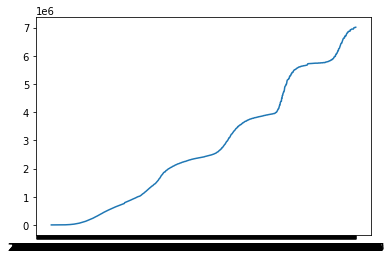

In [6]:
plt.plot(mx_data["date"],mx_data["total_cases"])
plt.show()

In **Seaborn** we need to declare a little bit more

<AxesSubplot:xlabel='date', ylabel='total_cases'>

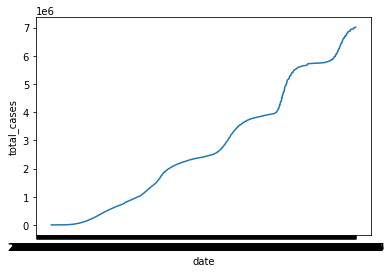

In [6]:
sns.lineplot(
data = mx_data,
x = "date",
y = "total_cases")

But in **Altair** we need to declare **MARKS** and **ENCODINGS** to have the same simple plot. Why???

In [7]:
alt.Chart(
        mx_data,
        width = 400
    ).mark_line(
        color='red',
    ).encode(
        x='date',
        y='total_cases'
)

alt.Chart(...)

The answer lies in the **Grammar of Graphics**

## Grammar or Graphics

**"Applied to visualizations, a grammar of graphics is a grammar used to describe and create a wide range of statistical graphics."**

*Wilkinson, Leland. (2005). The Grammar of Graphics.*

The components of the Layered Grammar of Graphs are:
    
- Layer
    - Data
    - Mapping
    - Statistical transformation (stat)
    - **Geometric object (geom)**
    - **Position adjustment (position)**
- Scale
- Coordinate system (coord)
- Faceting (facet)


Let's concentrate just in two aspects: **geoms (mark)** and **position (channel)**

### Marks

**Marks are basic geometric elements that depict items**

Marks are geometric primitives classified according to the number of dimensions they require. 

Examples: points (0D), lines (1D), areas (2D) and volumes (3D).

▪ Volume marks are not commonly used.

*Tamara Muzner. Visualization Analysis and Design*

![marks](../img/marks.png)

## Channels

**A visual channel is a way to control the appearance of marks, independent of the dimensionality of the geometric primitives.**

*Tamara Muzner. Visualization Analysis and Design*

There are some commonly seen channel types:
- position
- color 
- shape 
- size

![channels](../img/channels.png)

## Basic Graphs

### Bar Plot

Let's create a graph step by step. The first one is link the data and assign a mark

In [11]:
alt.Chart(
    data = mx_data,
    ).mark_bar()

alt.Chart(...)

Now we have a mark but means nothing. Why? Because we have no encoded yet.

So, let encode the date in the horizontal axis.

In [18]:
from altair import datum

alt.Chart(
    data = mx_data,
    width = 600
    ).mark_bar().encode(
        x='date',
    ).transform_filter(
    (datum.date >= '2022-07-01')
)

alt.Chart(...)

Now we have dates in the X axis but all have same height. This is because the vertical axis is not encoded yet.

It is when we assign the y-value to a variable that the bar plot makes sense.

In [19]:
from altair import datum

alt.Chart(
    data = mx_data,
    width = 600
    ).mark_bar(
        color = "#355070"
    ).encode(
        x='date',
        y='total_cases'
    ).transform_filter(
    (datum.date >= '2022-07-01')
)

alt.Chart(...)

Let's make other graphics

### Line Plot

For a line plot, we can use the same encoding and just change the mark

In [10]:
alt.Chart(
    data = mx_data,
    width = 600
    ).mark_line(
        color = "#355070"
    ).encode(
        x='date',
        y='total_cases'
    ).transform_filter(
    (datum.date >= '2022-07-01')
)

alt.Chart(...)

### Scatterplot

For creating a Scatterplot we need two quantitative metrics to encode in both axis. 

Let's create another dataset to play with.

In [3]:
asia_data = data.query('continent == "Asia" and date == "2022-07-01"')

In [13]:

alt.Chart(
    data = asia_data,
    width = 600
    ).mark_point(
    ).encode(
        x='handwashing_facilities',
        y='life_expectancy',
       color='location'
    )

alt.Chart(...)

Again, something is missing. We need anothe channel to differentiate between countries.

The color channel is a good one to use in this case

In [11]:

alt.Chart(
    data = asia_data,
    width = 600
    ).mark_point(
    ).encode(
        x='handwashing_facilities',
        y='life_expectancy',
        color='life_expectancy'
    )

alt.Chart(...)

### Heatmap

Finally, let's analize a Heatmap.

In this case, the color is encoded yet but not to a categorical but a quantitative metric. The kind of scale is different and therefore, the pallete type as well.

In [23]:
asia_data = data.query('continent == "Asia" and date > "2022-07-01"')

In [46]:

alt.Chart(
    data = asia_data,
    width = 600
    ).mark_rect(
    ).encode(
        x='location:O',
        y='date:O',
        color='new_cases:Q'
    )

alt.Chart(...)

Understanting the grammar of graphics let us create and manipulate in a better way what we eant to communicate.

Using hig-level libraries is perfect for quick cases but when we want to go to the next level, low-hivel libraries help us to customize every aspect of our graph.